## Battle of Neighbourhoods - Clustering the Neighbourhoods of Barcelona and Madrid 


Dimas

# 1. Introduction


Two of the biggest culturally vibrant and popular cities in Spain are Madrid and Barcelona. There are many distinction in and difference in the cultures Madrid being the Spanish Captial and Barcelona being the capital of the autonomous community of Catalonia.

Both Barcelona and Madrid are quite popular tourist attraction and vacation destination for people all around the world. They are both diverse and multicutural cities that offer a lot of unique experiences that is widely sought after. In this project we will try to we will try to group neighbourhoods of Barcelona and Madrid and compare and contrast what each city has to offer that is unique. Since Madrid and Barcelona are provinces they have over 500 municipalites,so for the purpose of this project we will just focus on the main cities for the purposes of this project

# 2. Business Problem

The goal is to help tourists choose their destinations depending on the unique experiences that each of te neighbourhood in the city has to offer. Based on the experiences a tourist or a person can choose where to go to get that sort of experience that they are looking for and can also help in terms of planning ahead for the trip. Our findings will offer beyond tourist attractions, we aim to offer entertainment venues, unique cuisines that are available in the neighbourhoods.  

# 3. Data

We require geographical location data for both Barcelona and Madrid. Each city will have a neighbourhood code and the district code, along with the name which then we can use to determine coordinates. Using coordinates we use can find out the  venues and their most popular venue categories for each neighborhood.





### Barcelona Data:

To derive the geographical data of Barcelona , we will visit the Open Data Service portal that has been provided by the Barcelona City governement in csv format: https://opendata-ajuntament.barcelona.cat/data/dataset/808daafa-d9ce-48c0-925a-fa5afdb1ed41/resource/4cc59b76-a977-40ac-8748-61217c8ff367/download/districtes_i_barris_170705.csv

The CSV file has data about all the neighbourhoods in Barcelona
***
1. *CODI_DISTRICTE*: District Code 
2. *NOM_DISTRICTE*: District Name
3. *CODI_BARRI*: Neighbourhood Code
4. *NOM_BARRI*: Neighbourhood Name
***


### Madrid Data:

To derive geographical data of Madrid, we will visit the Open Data Service portal that has been provided by the Madrid City governement in csv format: https://datos.madrid.es/egob/catalogo/200078-1-distritos-barrios.csv

The CSV file has data about all the neighbourhoods in Madrid we will only be leveraging the following attributes if necassary:
***
1. *Codigo de barrio*: Neighbourhood Code rename to: NOM_BARRI rename to: *NOM_BARRI*
2. *Codigo de distrito al que pertenece*: District code to which it belongs rename to: *CODI_DISTRICTE*
3. *Nombre de barrio*: Neighbourhood Name rename to: *NOM_BARRI*
***

###  Geocoder/ArcGIS API

ArcGIS Online enables you to connect people, locations, and data using interactive maps. Work with smart, data-driven styles and intuitive analysis tools that deliver location intelligence. Share your insights with the world or specific groups.



For our project purposes we will use the Geocoder package to call on ArcGIS API to retrieve the coordinates of all of the neighbourhood in both cities, and add the following attributes to both dataset:
***
1. *Latitude*: Latitude for Neighbourhood
2. *Longitude*: Longitude for Neighbourhood
***

### Venue Data using Foursquare API

We will need data about different venues in each neighbourhood. In order to gain that information we will leverage Foursquare api to provide information on all manner of venues and events within an area of interest.I nformation such as venue names, locations, menus and even photos. 

We will connect to the Foursquare API to gather information about venues inside each and every neighbourhood. For each neighbourhood, we have chosen the radius to be 500 meters.

The data retrieved from Foursquare contained information of venues within a specified distance of the longitude and latitude of the neighbourhood . The information obtained per venue as follows:

1. *Neighbourhood* : Name of the Neighbourhood
2. *Neighbourhood Latitude* : Latitude of the Neighbourhood
3. *Neighbourhood Longitude* : Longitude of the Neighbourhood
4. *Venue* : Name of the Venue
5. *Venue Latitude* : Latitude of Venue
6. *Venue Longitude* : Longitude of Venue
7. *Venue Category* : Category of Venue

Based on all the information collected for both Barcelona and Madrid, we will have sufficient data to build our model. We clustered  the neighbourhoods together based on similar venue categories. We will then present our observations and findings. Using this data, our stakeholders can take the necessary decision.



# 4. Methodology
We will be creating our model with the help of Python so we start off by importing all the required packages.

In [1]:
import pandas as pd 
import geocoder
from geopy.geocoders import Nominatim
pd.options.display.max_rows = 10000
import requests
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as colors
import folium
from sklearn.cluster import KMeans


Python Packages:

- Pandas : to read manipulate data in csv and then data analysis
- geocoder: to retrieve the coordinates for each neighborhood 
- requests : Handle http requests
- matplotlib : Detailing the generated maps
- folium : Generating maps of Barcelona and Madrid
- sklearn : To import Kmeans clustering machine learning model method

## Data Collection

In the data collection stage, we begin with collecting the required data for both cities of Barcelona and Madrid. We need data that has the neighbourhoods and districts they are located in for each of the cities. Both municipalities of Barcelona and Madrid have OpenData Portal which they provide datasets on the cities so we will leverage them accordingly to get the data



To collect data for Barcelona, we download the CSV file from https://opendata-ajuntament.barcelona.cat/data/dataset/808daafa-d9ce-48c0-925a-fa5afdb1ed41/resource/4cc59b76-a977-40ac-8748-61217c8ff367/download/districtes_i_barris_170705.csv



Using Pandas we load the table after reading the CSV file:



In [3]:
!wget -q -O 'barcelona_data.csv' https://opendata-ajuntament.barcelona.cat/data/dataset/808daafa-d9ce-48c0-925a-fa5afdb1ed41/resource/4cc59b76-a977-40ac-8748-61217c8ff367/download/districtes_i_barris_170705.csv
print('Data downloaded!')
dfb = pd.read_csv('barcelona_data.csv')
dfb.head()

Data downloaded!


,CODI_DISTRICTE,NOM_DISTRICTE,CODI_BARRI,NOM_BARRI
0,1,Ciutat Vella,1,el Raval
1,1,Ciutat Vella,2,el Barri Gòtic
2,1,Ciutat Vella,3,la Barceloneta
3,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera"
4,2,Eixample,5,el Fort Pienc


To collect data for Madrid, we download the CSV file from https://datos.madrid.es/egob/catalogo/200078-1-distritos-barrios.csv

Using Pandas we load the table after reading the CSV file:

In [4]:
!wget -q -O 'madrid_data.csv' https://datos.madrid.es/egob/catalogo/200078-1-distritos-barrios.csv
print('Data downloaded!')
dfm = pd.read_csv('madrid_data.csv', sep=';', encoding='latin-1')
dfm.head()

Data downloaded!


,Codigo de barrio,Codigo de distrito al que pertenece,Nombre de barrio,Nombre acentuado del barrio,Superficie (m2),Perimetro (m)
0,1,1,PALACIO,PALACIO,1471085,5754
1,1,2,IMPERIAL,IMPERIAL,967500,4557
2,1,3,PACIFICO,PACÍFICO,750065,4005
3,1,4,RECOLETOS,RECOLETOS,870857,3927
4,1,5,EL VISO,EL VISO,1708046,5269


## Data Preprocessing

For Madrid, We replace the names of specific columns with a short form name to remove the spaces and make it easier to call on those columns

1. *Codigo de barrio*: Neighbourhood Code rename to: *CODI_BARRI*
2. *Codigo de distrito al que pertenece*: District code to which it belongs rename to: *CODI_DISTRICTE*
3. *Nombre de barrio*: Neighbourhood Name rename to: *NOM_BARRI*

In [6]:
dfm = dfm.rename(columns = {"Codigo de barrio":"CODI_BARRI", "Codigo de distrito al que pertenece":"CODI_DISTRICTE", "Nombre de barrio":"NOM_BARRI"})

dfm

,CODI_BARRI,CODI_DISTRICTE,NOM_BARRI,Nombre acentuado del barrio,Superficie (m2),Perimetro (m)
0,1,1,PALACIO,PALACIO,1471085,5754
1,1,2,IMPERIAL,IMPERIAL,967500,4557
2,1,3,PACIFICO,PACÍFICO,750065,4005
3,1,4,RECOLETOS,RECOLETOS,870857,3927
4,1,5,EL VISO,EL VISO,1708046,5269
5,1,6,BELLAS VISTAS,BELLAS VISTAS,716261,3443
6,1,7,GAZTAMBIDE,GAZTAMBIDE,506596,2969
7,1,8,EL PARDO,EL PARDO,187642916,87125
8,1,9,CASA DE CAMPO,CASA DE CAMPO,17470075,19233
9,1,10,LOS CARMENES,LOS CÁRMENES,1292235,6186


## Feature Engineering

Looking at both of the dataset, we require the coordinates of each neiaghbourhood. In order to obtain set coordinates we will leverage the Geocoder package and using ArcGIS api we will obtain all coordinates

Below is an Barcelona geocode function that will return the Longitude and Latitude of each neighbourhood, and store them in a list. (Same function will be used for Madrid only the location will change from Barcelona, Barcelona (since Barcelona is also a province) to Madrid, Spain)

In [484]:
def get_latlng(NOM_BARRI):
    # initialize your variable to None
    lat_lng_coords = None
    # loop until you get the coordinates
    while(lat_lng_coords is None):
        g = geocoder.arcgis('{}, Barcelona, Barcelona'.format(NOM_BARRI))
        lat_lng_coords = g.latlng
    return lat_lng_coords
# Call the function to get the coordinates, store in a new list using list comprehension
coords = [ get_latlng(NOM_BARRI) for NOM_BARRI in dfb["NOM_BARRI"].tolist()]

We then merge our source data with the geographical co-ordinates to make our dataset ready for venue retrieval

In [485]:
dfb_coords = pd.DataFrame(coords, columns=['Latitude', 'Longitude'])
# Merge the coordinates into the original dataframe
dfb['Latitude'] = dfb_coords['Latitude']
dfb['Longitude'] = dfb_coords['Longitude']
print(dfb.shape)

(73, 6)


In [8]:
dfb.head()

,CODI_DISTRICTE,NOM_DISTRICTE,CODI_BARRI,NOM_BARRI
0,1,Ciutat Vella,1,el Raval
1,1,Ciutat Vella,2,el Barri Gòtic
2,1,Ciutat Vella,3,la Barceloneta
3,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera"
4,2,Eixample,5,el Fort Pienc


## Visualizing the Neighbourhoods of Barcelona and Madrid

We used the updated datasets to using the Folium package, we can visualize the maps of Barcelona and Mardid with the neighbourhoods marked.

Neighbourhood map of Barcelona:

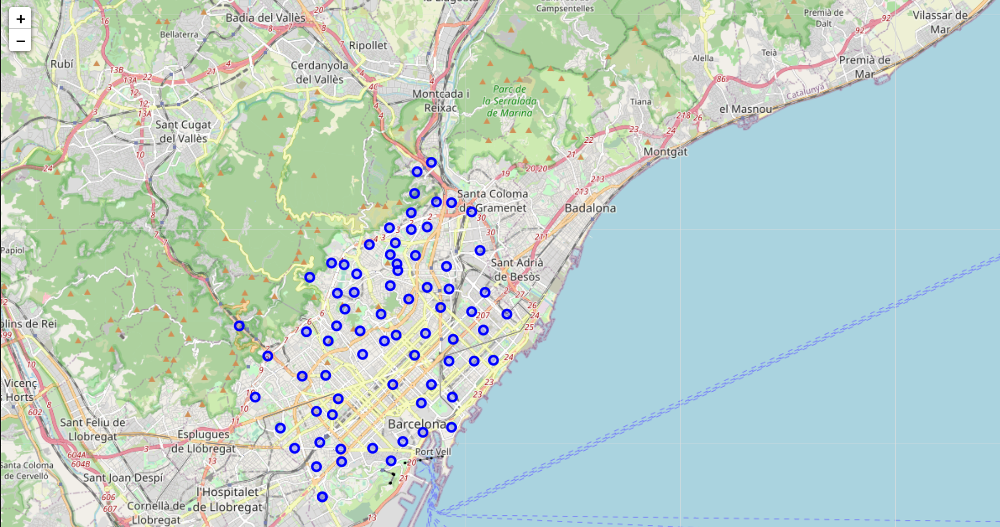

In [10]:
from IPython.display import Image
Image("/Users/nehaalpatel/desktop/b1.png")

Neighbourhood map of Madrid:

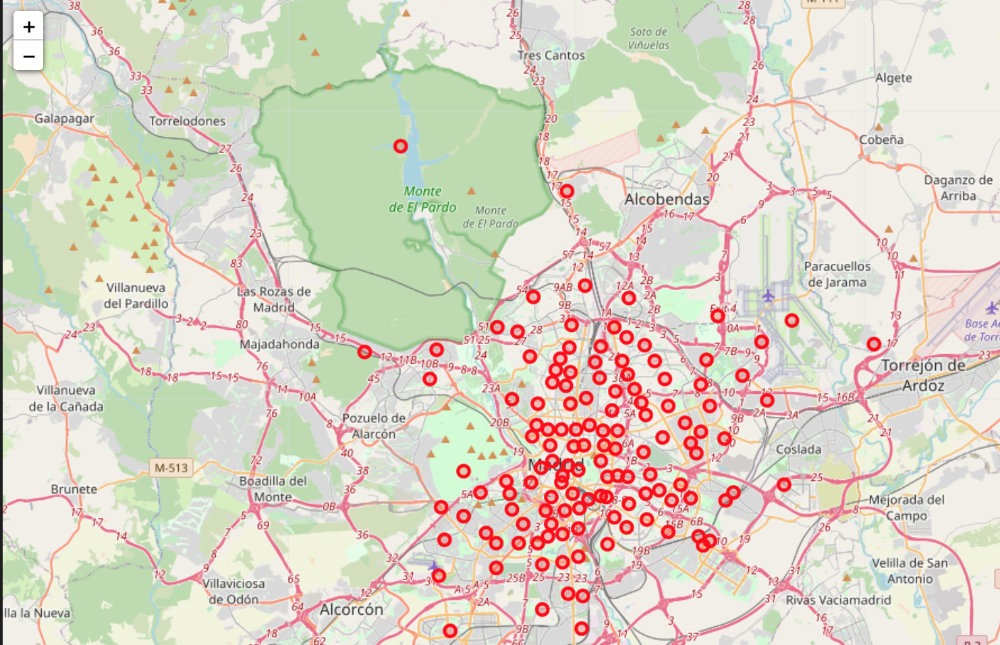

In [12]:
Image("/Users/nehaalpatel/desktop/m1.png")

Next we use Foursquare to find out what each neighbourhood is like and what are the common venue and venue categories within a 500m radius. We will create a function which collects information on each neighbourhood such as name of the neighbourhood, geo-coordinates, venue and venue categories.


In [ ]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius
            )
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighbourhood', 
                  'Neighbourhood Latitude', 
                  'Neighbourhood Longitude', 
                  'Venue', 
                  'Venue Category']
    
    return(nearby_venues)

Resulting data looks like:

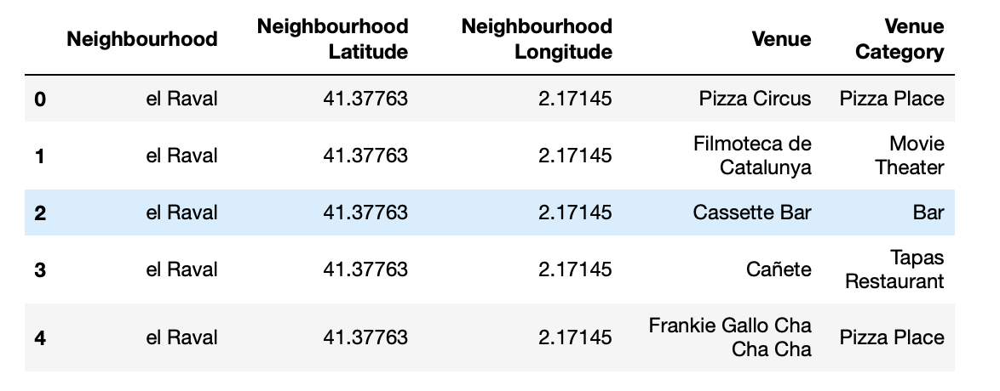

In [14]:
Image("/Users/nehaalpatel/desktop/v1.png")

## One Hot Encoding

To find out what are the different kinds of venue categories present in each neighbourhood and calculate the top 10 common venues to base our similarity, we used the One Hot Encoding to work with our categorical datatype of the venue categories and coverted them to numeric form. 
We performed one hot encoding and then calculate the mean of the grouped venue categories for each of the neighbourhoods.

In [ ]:
# one hot encoding
barcelona_onehot = pd.get_dummies(barcelona_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
barcelona_onehot['Neighbourhood'] = barcelona_venues['Neighbourhood'] 

# move neighborhood column to the first column
fixed_columns = [barcelona_onehot.columns[-1]] + list(barcelona_onehot.columns[:-1])
barcelona_onehot = barcelona_onehot[fixed_columns]

barcelona_grouped = barcelona_onehot.groupby('Neighbourhood').mean().reset_index()
barcelona_grouped

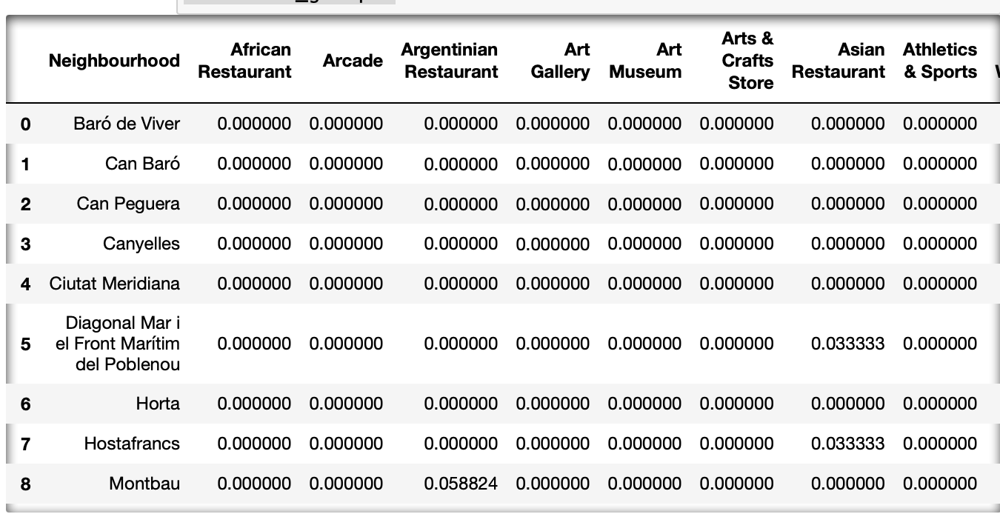

In [15]:
Image("/Users/nehaalpatel/desktop/v2.png")

## Getting Top Venues in the Neighbourhoods

We ranked and labeled the 10 categories to cluster the neighbourhoods.

In [ ]:
num_top_venues = 10

for hood in barcelona_grouped['Neighbourhood']:
    print("----"+hood+"----")
    temp = barcelona_grouped[barcelona_grouped['Neighbourhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

function to get the top venue categories in the neighbourhood

In [ ]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Getting top venue categories in Barcelona and placing in  dataframe

In [ ]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighbourhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighbourhoods_venues_sorted = pd.DataFrame(columns=columns)
neighbourhoods_venues_sorted['Neighbourhood'] = barcelona_grouped['Neighbourhood']

for ind in np.arange(barcelona_grouped.shape[0]):
    neighbourhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(barcelona_grouped.iloc[ind, :], num_top_venues)

neighbourhoods_venues_sorted.head()

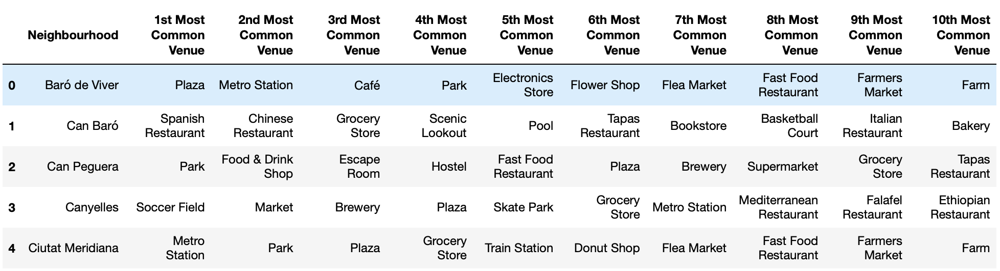

In [18]:
Image("/Users/nehaalpatel/desktop/v3.png")

## Model Building

We used the KMeans Machine Learning Clustering  algorithm to cluster neighbourhoods that are similar by top venus to together. In this case we used 5 clusters

In [ ]:
# number of clusters
kclusters = 5

barcelona_grouped_clustering = barcelona_grouped.drop('Neighbourhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(barcelona_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

Created a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood and merged with neighbourhood venues to add latitude and longitude for each neighbourhoodm and dropped all the NaN values to prevent data skew

In [ ]:
# add clustering labels
neighbourhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

barcelona_merged = dfb

barcelona_merged = barcelona_merged.join(neighbourhoods_venues_sorted.set_index('Neighbourhood'), on='NOM_BARRI')

barcelona_merged.head() # check the last columns!

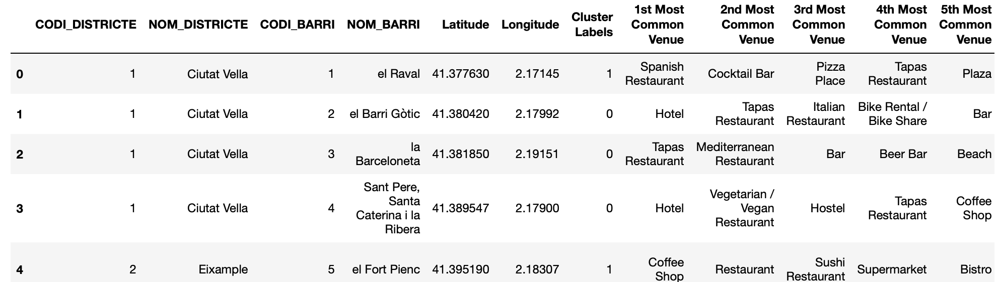

In [19]:
Image("/Users/nehaalpatel/desktop/v4.png")

## Visualize the clustered Neighbourhoods

We will leverage the Folium package to see the clustered neighbourhoods on the map for Barcelona and Madrid

Map of clustered neighbourhoods of Barcelona:



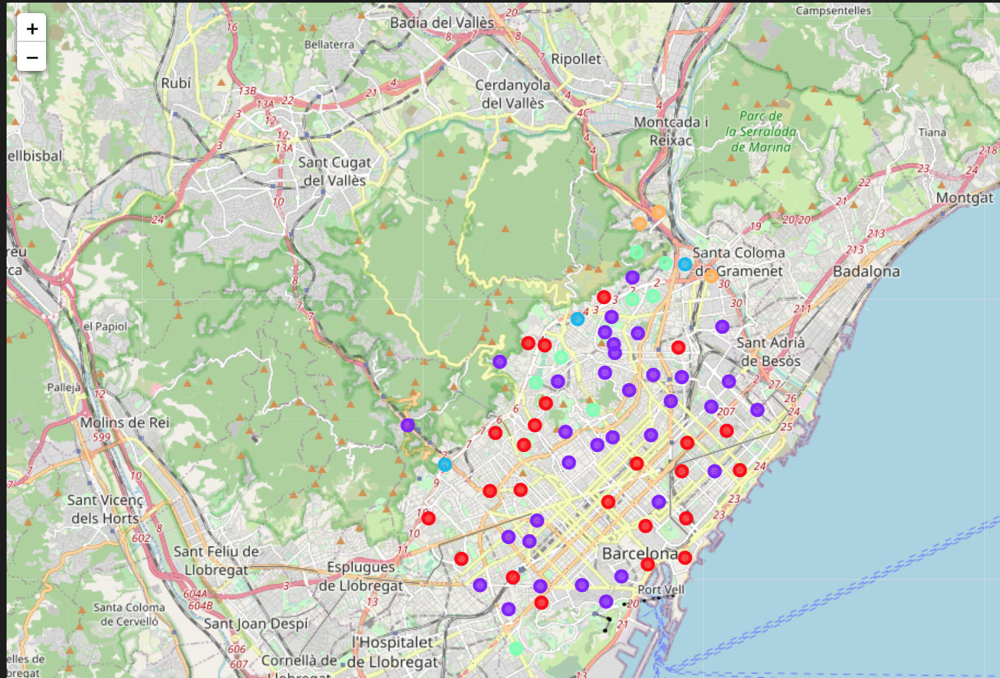

In [20]:
Image("/Users/nehaalpatel/desktop/b2.png")

Map of clustered neighbourhoods of Madrid:



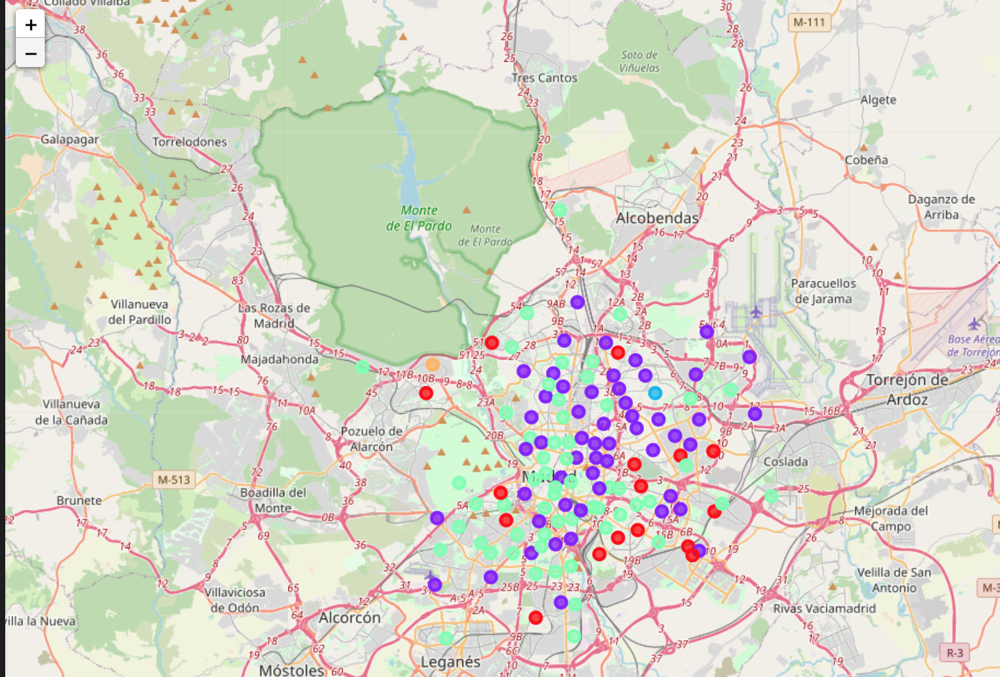

In [21]:
Image("/Users/nehaalpatel/desktop/m2.png")

## Examining the Clusters

Cluster 1




In [ ]:
barcelona_merged.loc[barcelona_merged['Cluster Labels'] == 0, barcelona_merged.columns[[1] + list(range(5, barcelona_merged.shape[1]))]]

Cluster 2

In [ ]:
barcelona_merged.loc[barcelona_merged['Cluster Labels'] == 1, barcelona_merged.columns[[1] + list(range(5, barcelona_merged.shape[1]))]]

Cluster 3

In [ ]:
barcelona_merged.loc[barcelona_merged['Cluster Labels'] == 2, barcelona_merged.columns[[1] + list(range(5, barcelona_merged.shape[1]))]]

Cluster 4

In [ ]:
barcelona_merged.loc[barcelona_merged['Cluster Labels'] == 3, barcelona_merged.columns[[1] + list(range(5, barcelona_merged.shape[1]))]]

Cluster 5

In [ ]:
barcelona_merged.loc[barcelona_merged['Cluster Labels'] == 4, barcelona_merged.columns[[1] + list(range(5, barcelona_merged.shape[1]))]]

# 4. Results and Discussion

The neighbourhoods of Barcelona, and Madrid are offer both similar and different mutlicutlural experiences at the same time. Let's start of by discussing the geography, Madrid is a bustling capital on arid plains in the heart of Spain it is bigger and has about 132 neighbourhoods to explore. Barcelona is relatively small with 73 neighbourhoods to expore. Barcelona is more of an Mediterranean city and offers a lot more natural, and picturesque natural scenery. Both have historical sites and museums although Barcelona has more extraordinary art and architecture on the street to enjoy like the Gothic quarter, it is a perfect combination of City and Beach. Meanwhile, Madrid is a cosmopolitian city, and offers a lot more possibilities in terms of entertainment and Spanish atmosphere. 

In terms of cuisines both Barcelona and Madrid offer wide variety of international cuisines. Barcelona offers more Catalan cuisine and is more vegetarian and vegan friendly, while Madrid offers more traditional Spanish, and a gourmet experience. Both have really good street markets to offer like Barcelona's La Ramblas and Madrid's Rastro. If you are looking for more cosmopolitian and bustling city with lots of entertainment like experience Madrid will be the choice. If you are looking for more combination of city and beach/nature with architecture and art on the street then Barcelona will be the choice.

# 5. Conclusion

The purpose of this project was to explore the two of the biggest cities Spain (Barcelona and Madrid) and see how attractive it is to potential tourists and migrants. We explored both the cities based on their neighbourhoods and then extrapolated the common venues present in each of the neighbourhoods finally concluding with clustering similar neighbourhoods together.

We can conclude that each of the neighbourhoods in both the cities are culturally diverse and offer a wide variety of unique experiences which is unique in it's own way.

Both cities (Barcelona and Madrid) seem to offer a nice vacation stay with a lot of places to explore, and variety of unique activites to do. Overall, it's up to the individual to decide which experience they would prefer more cosmopolitian with lot's of possibilities of enterntainment(Madrid) or a combination of city along with natural scenery with extra ordinary arts and architecture integrated within it's streets (Barcelona).

The detailed code is available on the following link:
https://github.com/Dimas263/Data-Science-Professional-IBM

To view the notebook with full maps: https://dataplatform.cloud.ibm.com/analytics/notebooks/v2/efe9e0e3-a28a-4e40-819c-af68298e8ef9/view?access_token=0f67018af7a36b1d042dd17409a9575cc50c4e7393b35f7d0a209bd6cc3680e5